Data Sources:
- https://data.worldbank.org/indicator/SH.MED.BEDS.ZS
- https://population.un.org/wpp/DataQuery/

Estimated True Cases Calculation Citation:
- https://science.sciencemag.org/content/368/6490/489

In [1]:
from scipy.integrate import odeint
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
def world_map(resources, df2):
    datasets = []
    for link in resources:
        df = pd.read_csv(link)
        df = df[df['Country/Region'] != 'Diamond Princess']
        df = df[df['Country/Region'] != 'MS Zaandam']
        df = df.drop(['Province/State'], axis=1)
        df = df.reset_index(drop=True)
        df = df.groupby('Country/Region').sum()
        df = df.reset_index()
        df.loc[df.loc[df['Country/Region'] == 'US'].index,
               'Country/Region'] = 'United States of America'
        df.loc[df.loc[df['Country/Region'] == 'United Kingdom'].index,
               'Country/Region'] = 'United Kingdom of Great Britain and Northern Ireland'
        df.loc[df.loc[df['Country/Region'] == 'Russia'].index,
               'Country/Region'] = 'Russian Federation'
        df.loc[df.loc[df['Country/Region'] == 'Venezuela'].index,
               'Country/Region'] = 'Venezuela (Bolivarian Republic of)'
        df.loc[df.loc[df['Country/Region'] == 'Bolivia'].index,
               'Country/Region'] = 'Bolivia (Plurinational State of)'
        df.loc[df.loc[df['Country/Region'] == 'Taiwan*'].index,
               'Country/Region'] = 'Taiwan, Province of China'
        df.loc[df.loc[df['Country/Region'] == 'Syria'].index,
               'Country/Region'] = 'Syrian Arab Republic'
        df.loc[df.loc[df['Country/Region'] == 'Korea, South'].index,
               'Country/Region'] = 'Korea, Republic of'
        df.loc[df.loc[df['Country/Region'] == 'Iran'].index,
               'Country/Region'] = 'Iran (Islamic Republic of)'
        df.loc[df.loc[df['Country/Region'] == 'Cote d\'Ivoire'].index,
               'Country/Region'] = 'Côte d\'Ivoire'
        df.loc[df.loc[df['Country/Region'] ==
                      'Congo (Kinshasa)'].index, 'Country/Region'] = 'Congo, Democratic Republic of the'
        df.loc[df.loc[df['Country/Region'] ==
                      'Congo (Brazzaville)'].index, 'Country/Region'] = 'Congo'
        df.loc[df.loc[df['Country/Region'] == 'Moldova'].index,
               'Country/Region'] = 'Moldova, Republic of'
        df.loc[df.loc[df['Country/Region'] == 'Tanzania'].index,
               'Country/Region'] = 'Tanzania, United Republic of'
        df.loc[df.loc[df['Country/Region'] == 'Brunei'].index,
               'Country/Region'] = 'Brunei Darussalam'
        code2 = []
        for i in df['Country/Region']:
            try:
                code2.append(df2[df2['name'] == i]['alpha-3'].values[0])
            except:
                code2.append('NA')

        df['code'] = code2
        df.loc[df.loc[df['Country/Region'] == 'United Kingdom of Great Britain and Northern Ireland'].index,
               'Country/Region'] = 'United Kingdom'
        datasets.append(df)

    for i in range(len(datasets)):
        datasets[i] = datasets[i].drop(
            ['Lat', 'Long'], axis=1)
        datasets[i] = datasets[i].melt(
            id_vars=["Country/Region", "code"],
            var_name="Dates",
            value_name="Cases")

    return datasets

In [3]:
data = pd.read_csv('../data/all.csv')
up, low = np.inf, 0
resources = ['https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv',
             'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv',
             'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
            ]

data_list = world_map(resources, data)

In [4]:
new = pd.DataFrame([data_list[0]['Country/Region'], data_list[0]['code'], 
                    data_list[0]['Dates'], data_list[0].iloc[:, -1], data_list[1].iloc[:, -1], 
                    data_list[2].iloc[:, -1]]).transpose()

new.tail()

,Country/Region,code,Dates,Cases,Cases,Cases
28081,West Bank and Gaza,NA,6/20/20,784,437,3
28082,Western Sahara,ESH,6/20/20,9,8,1
28083,Yemen,YEM,6/20/20,922,328,254
28084,Zambia,ZMB,6/20/20,1430,1194,11
28085,Zimbabwe,ZWE,6/20/20,479,63,4


In [5]:
def comulative_plot(negatives, positives, survivors, dates_range):
    fig = go.Figure(
        data=[go.Scatter(x=dates_range, y=negatives,
                         mode="lines", name='Cases',
                         line=dict(width=2, color="blue")),
              go.Scatter(x=dates_range, y=positives,
                         mode="lines", name='Recovered',
                         line=dict(width=2, color="green")),
             go.Scatter(x=dates_range, y=survivors,
                         mode="lines", name='Deths',
                         line=dict(width=2, color="orange"))],
            layout=go.Layout(
            title_text="Comulative Results Over Time", hovermode="closest",
            updatemenus= [
                {
                    "buttons": [
                        {
                            "args": [None, {"frame": {"duration": 100, "redraw": False},
                                            "fromcurrent": True, 
                                            "transition": {"duration": 10,
                                                           "easing": "quadratic-in-out"}}],
                            "label": "Play",
                            "method": "animate"
                        },
                        {
                            "args": [[None], {"frame": {"duration": 0, "redraw": False},
                                              "mode": "immediate",
                                              "transition": {"duration": 0}}],
                            "label": "Pause",
                            "method": "animate"
                        }
                    ],
                    "direction": "left",
                    "pad": {"r": 10, "t": 87},
                    "showactive": False,
                    "type": "buttons",
                    "x": 0.14,
                    "xanchor": "right",
                    "y": 1.65,
                    "yanchor": "top"
                }
            ]),

        frames=[go.Frame(
            data=[go.Scatter(
                x=[i for i in range(k)],
                y=negatives,
                mode="lines",
                line=dict(width=2, color="blue")),
                 go.Scatter(
                x=[i for i in range(k)],
                y=positives,
                mode="lines",
                line=dict(width=2, color="green")),
                 go.Scatter(
                x=[i for i in range(k)],
                y=survivors,
                mode="lines",
                line=dict(width=2, color="orange"))])

            for k in range(len(negatives))],

    )
    fig.update_xaxes(title_text="Number of Days")
    fig.update_yaxes(title_text="Number")
    fig.show()

In [150]:
df = pd.read_csv('../data/API_SH.MED.BEDS.ZS_DS2_en_csv_v2_1120885.csv', skiprows=[0, 1, 2])
df = df.drop(columns=["Country Name", "Indicator Name", "Indicator Code"])
df.set_index('Country Code', inplace=True)
df.head()
#df.columns

,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
Country Code,,,,,,,,,,,,,,,,,,,,,
ABW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AFG,0.170627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.4,0.5,0.5,0.5,0.5,NaN,NaN,NaN,NaN,NaN
AGO,2.061462,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ALB,5.102676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.6,2.9,2.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AND,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [151]:
df['Beds'] = df.ffill(axis=1).iloc[:, -1]
df = df[df['Beds'].notna()]
#df.isnull().mean() * 100
df = df['Beds']
df

Country Code
AFG    0.500000
AGO    0.800000
ALB    2.900000
AND    2.500000
ARB    1.624524
         ...   
WSM    1.000000
YEM    0.700000
ZAF    2.800000
ZMB    2.000000
ZWE    1.700000
Name: Beds, Length: 246, dtype: float64

In [8]:
merged_one = pd.merge(left=new, right=df, left_on='code', right_on=df.index)
merged_one

,Country/Region,code,Dates,Cases,Cases,Cases,Beds
0,Afghanistan,AFG,1/22/20,0,0,0,0.5
1,Afghanistan,AFG,1/23/20,0,0,0,0.5
2,Afghanistan,AFG,1/24/20,0,0,0,0.5
3,Afghanistan,AFG,1/25/20,0,0,0,0.5
4,Afghanistan,AFG,1/26/20,0,0,0,0.5
...,...,...,...,...,...,...,...
26571,Zimbabwe,ZWE,6/16/20,391,62,4,1.7
26572,Zimbabwe,ZWE,6/17/20,401,63,4,1.7
26573,Zimbabwe,ZWE,6/18/20,463,63,4,1.7
26574,Zimbabwe,ZWE,6/19/20,479,63,4,1.7


In [9]:
df2 = pd.read_excel('../data/PopulationAgeSex-20200621022821.xlsx', sheet_name='Data', skiprows=[0, 2, 3, 4])
df2 = df2.drop(columns=["ISO 3166-1 numeric code", "Time", "Sex", "Note"])
df2.Location = [i.lstrip() for i in list(df2.Location.values)]
df2.head()

,Location,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,...,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95-99,100+
0,Eastern Africa,67968.0,62070.0,56160.0,49515.0,42593.0,35563.0,29613.0,24495.0,19637.0,...,9531.0,7392.0,5457.0,3742.0,2236.0,1099.0,414.0,90.0,12.0,1.0
1,Burundi,2054.0,1819.0,1508.0,1217.0,1043.0,987.0,875.0,664.0,447.0,...,232.0,201.0,138.0,70.0,42.0,22.0,8.0,2.0,0.0,0.0
2,Comoros,124.0,114.0,102.0,90.0,80.0,71.0,64.0,54.0,43.0,...,23.0,18.0,12.0,7.0,5.0,2.0,1.0,0.0,0.0,0.0
3,Djibouti,99.0,98.0,89.0,91.0,90.0,87.0,86.0,76.0,67.0,...,36.0,26.0,18.0,14.0,8.0,4.0,2.0,0.0,0.0,0.0
4,Eritrea,495.0,477.0,487.0,374.0,285.0,287.0,269.0,191.0,141.0,...,84.0,68.0,60.0,47.0,30.0,15.0,6.0,2.0,0.0,0.0


In [10]:
merged_one2 = pd.merge(left=merged_one, right=df2, left_on='Country/Region', right_on=df2.Location)
merged_one2

,Country/Region,code,Dates,Cases,Cases,Cases,Beds,Location,0-4,5-9,...,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95-99,100+
0,Afghanistan,AFG,1/22/20,0,0,0,0.5,Afghanistan,5673.0,5416.0,...,808.0,613.0,445.0,312.0,168.0,76.0,24.0,5.0,1.0,0.0
1,Afghanistan,AFG,1/23/20,0,0,0,0.5,Afghanistan,5673.0,5416.0,...,808.0,613.0,445.0,312.0,168.0,76.0,24.0,5.0,1.0,0.0
2,Afghanistan,AFG,1/24/20,0,0,0,0.5,Afghanistan,5673.0,5416.0,...,808.0,613.0,445.0,312.0,168.0,76.0,24.0,5.0,1.0,0.0
3,Afghanistan,AFG,1/25/20,0,0,0,0.5,Afghanistan,5673.0,5416.0,...,808.0,613.0,445.0,312.0,168.0,76.0,24.0,5.0,1.0,0.0
4,Afghanistan,AFG,1/26/20,0,0,0,0.5,Afghanistan,5673.0,5416.0,...,808.0,613.0,445.0,312.0,168.0,76.0,24.0,5.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25212,Zimbabwe,ZWE,6/16/20,391,62,4,1.7,Zimbabwe,2097.0,2211.0,...,309.0,240.0,185.0,115.0,86.0,44.0,15.0,3.0,0.0,0.0
25213,Zimbabwe,ZWE,6/17/20,401,63,4,1.7,Zimbabwe,2097.0,2211.0,...,309.0,240.0,185.0,115.0,86.0,44.0,15.0,3.0,0.0,0.0
25214,Zimbabwe,ZWE,6/18/20,463,63,4,1.7,Zimbabwe,2097.0,2211.0,...,309.0,240.0,185.0,115.0,86.0,44.0,15.0,3.0,0.0,0.0
25215,Zimbabwe,ZWE,6/19/20,479,63,4,1.7,Zimbabwe,2097.0,2211.0,...,309.0,240.0,185.0,115.0,86.0,44.0,15.0,3.0,0.0,0.0


In [11]:
merged_one2[merged_one2['Country/Region'] == 'United Kingdom']

,Country/Region,code,Dates,Cases,Cases,Cases,Beds,Location,0-4,5-9,...,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95-99,100+
24160,United Kingdom,GBR,1/22/20,0,0,0,2.8,United Kingdom,3924.0,4120.0,...,4539.0,3905.0,3382.0,3388.0,2442.0,1737.0,1078.0,491.0,130.0,16.0
24161,United Kingdom,GBR,1/23/20,0,0,0,2.8,United Kingdom,3924.0,4120.0,...,4539.0,3905.0,3382.0,3388.0,2442.0,1737.0,1078.0,491.0,130.0,16.0
24162,United Kingdom,GBR,1/24/20,0,0,0,2.8,United Kingdom,3924.0,4120.0,...,4539.0,3905.0,3382.0,3388.0,2442.0,1737.0,1078.0,491.0,130.0,16.0
24163,United Kingdom,GBR,1/25/20,0,0,0,2.8,United Kingdom,3924.0,4120.0,...,4539.0,3905.0,3382.0,3388.0,2442.0,1737.0,1078.0,491.0,130.0,16.0
24164,United Kingdom,GBR,1/26/20,0,0,0,2.8,United Kingdom,3924.0,4120.0,...,4539.0,3905.0,3382.0,3388.0,2442.0,1737.0,1078.0,491.0,130.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24306,United Kingdom,GBR,6/16/20,299600,1293,42054,2.8,United Kingdom,3924.0,4120.0,...,4539.0,3905.0,3382.0,3388.0,2442.0,1737.0,1078.0,491.0,130.0,16.0
24307,United Kingdom,GBR,6/17/20,300717,1304,42238,2.8,United Kingdom,3924.0,4120.0,...,4539.0,3905.0,3382.0,3388.0,2442.0,1737.0,1078.0,491.0,130.0,16.0
24308,United Kingdom,GBR,6/18/20,301935,1313,42373,2.8,United Kingdom,3924.0,4120.0,...,4539.0,3905.0,3382.0,3388.0,2442.0,1737.0,1078.0,491.0,130.0,16.0
24309,United Kingdom,GBR,6/19/20,303285,1319,42546,2.8,United Kingdom,3924.0,4120.0,...,4539.0,3905.0,3382.0,3388.0,2442.0,1737.0,1078.0,491.0,130.0,16.0


In [3]:
country_name = 'Italy'
dates_range = list(merged_one2[merged_one2['Country/Region']==country_name]['Dates'])
cases = merged_one2[merged_one2['Country/Region']==country_name].iloc[:, 3].values
recovered = merged_one2[merged_one2['Country/Region']==country_name].iloc[:, 4].values
deths = merged_one2[merged_one2['Country/Region']==country_name].iloc[:, 5].values
population = int(sum(merged_one2[merged_one2['Country/Region']==country_name].values[0][8:])*1000)
country_latest = list(merged_one2[(merged_one2['Country/Region']==country_name) & (merged_one2['Dates']==list(merged_one2['Dates'].unique())[::-1][0])].values[0])
cum_cases = country_latest[3]
cum_recovered = country_latest[4]
cum_deths = country_latest[5]
beds = int(country_latest[6]*population/1000)
age_dist = dict(zip(list(merged_one2.columns[8:]), 
                      [int(i) for i in list(merged_one2[merged_one2['Country/Region']==country_name].values[0][8:]*1000)]))
age_props = dict(zip(list(merged_one2.columns[8:]), np.array(list(age_dist.values()))/population))
# https://science.sciencemag.org/content/368/6490/489
true_cum_cases = cum_cases/0.14
likelihood_to_get_it = (true_cum_cases/population)*100

plt.plot(dates_range, cases)
plt.plot(dates_range, recovered)
plt.plot(dates_range, deths)
plt.show()

NameError: name 'merged_one2' is not defined

Text(0.5, 1.0, 'Population Age')

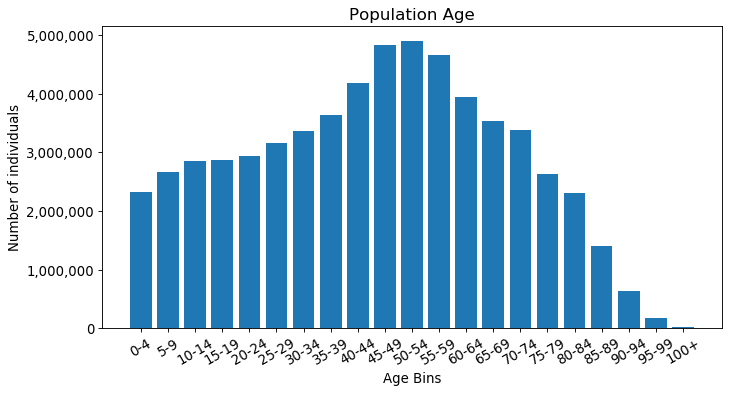

In [193]:
import matplotlib

fig = plt.figure(num=None, figsize=(10, 5), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(111)
ax.bar(range(len(age_dist)), list(age_dist.values()), align='center')
ax.set_xticks(range(len(age_dist)))
ax.set_xticklabels(list(age_dist.keys()))
ax.tick_params(axis="x", labelsize=12, rotation=30)
ax.tick_params(axis="y", labelsize=12)
ax.get_yaxis().set_major_formatter(
        matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.set_xlabel("Age Bins", fontsize=12)
ax.set_ylabel("Number of individuals", fontsize=12)
ax.set_title("Population Age", fontsize=15)

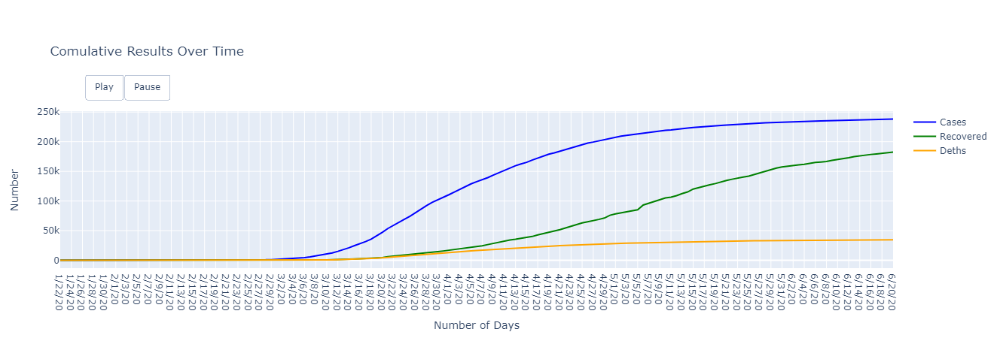

In [14]:
comulative_plot(cases,  recovered,  deths, dates_range)

In [15]:
def r_time(t, R0_beg, R0_end, dec_factor, x0):
    adaptive_r = ((R0_beg-R0_end)/(1+np.exp(-dec_factor*(-t+x0)))) + R0_end
    return adaptive_r

def alpha(scaling, I, N, opt_alpha):
        return scaling * (I/N) + opt_alpha

def ad_seir_step_ahead(y, t, N, gamma, delta, scaling, opt_alpha, rho, R0_beg, R0_end, dec_factor, x):
    S, E, I, R, D = y
    r_t = r_time(t, R0_beg, R0_end, dec_factor, x)
    alpha_t = alpha(scaling, I, N, opt_alpha)
    beta_t = r_t * (1/(alpha_t*(1/rho)+(1-alpha_t)*(1/gamma)))
    dsdt = -beta_t * I * (S / N)
    dedt = beta_t * I * (S / N) - delta * E
    didt = delta * E - (1 - alpha_t) * gamma * I - alpha_t * rho * I
    drdt = (1 - alpha_t) * gamma * I
    dddt = alpha_t * rho * I
    return dsdt, dedt, didt, drdt, dddt

def ad_SEIR_sim(N, sim_days, orig_esposed, days, inc_days, scaling, opt_alpha, death_days, 
                R0_beg, R0_end, dec_factor, x):
    # Initial conditions: S0, E0, I0, R0, D0
    y0 = N-orig_esposed, orig_esposed, 0, 0, 0
    gamma = 1.0 / days
    delta = 1.0 / inc_days
    rho = 1.0 / death_days
    t = np.linspace(0, sim_days-1, sim_days)
    r_t = [r_time(i, R0_beg, R0_end, dec_factor, x) for i in range(len(t))]
    sim_res = odeint(ad_seir_step_ahead, y0, t, args=(N, gamma, delta, scaling, opt_alpha,
                                                      rho, R0_beg, R0_end, dec_factor, x))
    S, E, I, R, D = sim_res.T
    alpha_t = [alpha(scaling, i, N, opt_alpha) for i in I]
    return S, E, I, R, D, r_t, alpha_t

def r_time2(t, sim_days, scale_factor):
    return scale_factor*np.sin(t/(sim_days/10))+scale_factor +1

def ad_seir_step_ahead2(y, t, N, gamma, delta, scaling, opt_alpha, rho, sim_days, scale_factor):
    S, E, I, R, D = y
    r_t = r_time2(t, sim_days, scale_factor)
    alpha_t = alpha(scaling, I, N, opt_alpha)
    beta_t = r_t * (1/(alpha_t*(1/rho)+(1-alpha_t)*(1/gamma)))
    dsdt = -beta_t * I * (S / N)
    dedt = beta_t * I * (S / N) - delta * E
    didt = delta * E - (1 - alpha_t) * gamma * I - alpha_t * rho * I
    drdt = (1 - alpha_t) * gamma * I
    dddt = alpha_t * rho * I
    return dsdt, dedt, didt, drdt, dddt

def ad_SEIR_sim2(N, sim_days, orig_esposed, days, inc_days, scaling, opt_alpha, death_days, scale_factor):
    # Initial conditions: S0, E0, I0, R0, D0
    y0 = N-orig_esposed, orig_esposed, 0, 0, 0
    gamma = 1.0 / days
    delta = 1.0 / inc_days
    rho = 1.0 / death_days
    t = np.linspace(0, sim_days-1, sim_days)
    r_t = [r_time2(i, sim_days, scale_factor) for i in range(len(t))]
    sim_res = odeint(ad_seir_step_ahead2, y0, t, args=(N, gamma, delta, scaling, opt_alpha,
                                                      rho, sim_days, scale_factor))
    S, E, I, R, D = sim_res.T
    alpha_t = [alpha(scaling, i, N, opt_alpha) for i in I]
    return S, E, I, R, D, r_t, alpha_t

In [152]:
def virus_SEIR_plot(negatives, esposed, positives, survivors, deths, R0, alpha, daily_deths, avoidable_deths):
    fig = make_subplots(rows=3, cols=2, 
                       specs=[[{"colspan": 2}, None], [{ }, { }], [{"colspan": 2}, None]], horizontal_spacing = 0.2,
                       vertical_spacing = 0.1)

    fig.add_trace(
        go.Scatter(x=[i for i in range(len(negatives))], y=negatives,
                         mode="lines", name='Susceptible',
                         line=dict(width=2, color="blue")),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(x=[i for i in range(len(negatives))], y=esposed,
                         mode="lines", name='Esposed',
                         line=dict(width=2, color="red")),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(x=[i for i in range(len(negatives))], y=positives,
                         mode="lines", name='Infected',
                         line=dict(width=2, color="green")),
        row=1, col=1
    )
    
    fig.add_trace(
        go.Scatter(x=[i for i in range(len(negatives))], y=deths,
                         mode="lines", name='Deths',
                         line=dict(width=2, color="black")),
        row=1, col=1
    )
        
    fig.add_trace(
        go.Scatter(x=[i for i in range(len(negatives))], y=survivors,
                         mode="lines", name='Recovered',
                         line=dict(width=2, color="orange")),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(x=[i for i in range(len(negatives))], y=R0,
                                 mode="lines", name='R0 Landscape',
                                 line=dict(width=2)),
        row=2, col=1)

    fig.add_trace(
        go.Scatter(x=[i for i in range(len(negatives))], y=alpha,
                                 mode="lines", name='α Landscape',
                                 line=dict(width=2)),
        row=2, col=2)
    
    fig.add_trace(
        go.Scatter(x=[i for i in range(len(negatives))], y=daily_deths,
                                 mode="lines", name='Daily Deths',
                                 line=dict(width=2)),
        row=3, col=1) 
    
    fig.add_trace(
    go.Scatter(x=[i for i in range(len(negatives))], y=avoidable_deths,
                             mode="lines", name='Avoidable Deths',
                             line=dict(width=2)),
    row=3, col=1) 

    frames=[go.Frame(
            data=[go.Scatter(
                x=[i for i in range(k)],
                y=negatives,
                mode="lines",
                line=dict(width=2, color="blue")),
                 go.Scatter(
                x=[i for i in range(k)],
                y=esposed,
                mode="lines",
                line=dict(width=2, color="red")),
                 go.Scatter(
                x=[i for i in range(k)],
                y=positives,
                mode="lines",
                line=dict(width=2, color="green")),
                 go.Scatter(
                x=[i for i in range(k)],
                y=deths,
                mode="lines",
                line=dict(width=2, color="black")),
                 go.Scatter(
                x=[i for i in range(k)],
                y=survivors,
                mode="lines",
                line=dict(width=2, color="orange")), 
                go.Scatter(
                x=[i for i in range(k)],
                y=R0,
                mode="lines",
                line=dict(width=2)), 
                go.Scatter(
                x=[i for i in range(k)],
                y=alpha,
                mode="lines",
                line=dict(width=2)),
                go.Scatter(
                x=[i for i in range(k)],
                y=daily_deths,
                mode="lines",
                line=dict(width=2)),
                go.Scatter(
                x=[i for i in range(k)],
                y=avoidable_deths,
                mode="lines",
                line=dict(width=2))], 
                layout=go.Layout(
                    annotations=[dict(
                                                    text="                    R<sub>0</sub>="+ str(round(R0[k], 2)), 
                                                   showarrow=False,
                                                    arrowhead=0,
                                                   font=dict(
                                                        color="black",
                                                        size=18
                                                    ),
                                                    xshift=282,
                                                    yshift=-116
                                                    ),
                                dict(
                                                    text="                    α<sub>0</sub>="+ str(round(alpha[k], 3)), 
                                                   showarrow=False,
                                                    arrowhead=0,
                                                   font=dict(
                                                        color="black",
                                                        size=18
                                                    ),
                                                    xshift=284,
                                                    yshift=-140)
                                ]),

                traces=[0,1,2,3,4,5,6,7,8,9])

            for k in range(len(negatives))]
    
    fig.frames=frames
        
    fig.update_layout(updatemenus= [
                {
                    "buttons": [
                        {
                            "args": [None, {"frame": {"duration": 100, "redraw": False},
                                            "fromcurrent": True, 
                                            "transition": {"duration": 10,
                                                           "easing": "quadratic-in-out"}}],
                            "label": "Play",
                            "method": "animate"
                        },
                        {
                            "args": [[None], {"frame": {"duration": 0, "redraw": False},
                                              "mode": "immediate",
                                              "transition": {"duration": 0}}],
                            "label": "Pause",
                            "method": "animate"
                        }
                    ],
                    "direction": "left",
                    "pad": {"r": 10, "t": 87},
                    "showactive": False,
                    "type": "buttons",
                    "x": 0.14,
                    "xanchor": "right",
                    "y": 1.25,
                    "yanchor": "top"
                }
            ],)

    fig.update_layout(height=800, width=800, 
                      title_text="Coronavirus SEIR Model (Avg R<sub>0</sub>="+ str(round(np.mean(R0), 2))+ ', α=' + str(round(np.mean(alpha), 3))+ ')')
    fig.update_xaxes(title_text="Days", row=1, col=1)
    fig.update_yaxes(title_text="Number of Cases", row=1, col=1)
    fig.update_yaxes(title_text="R<sub>0</sub>", row=2, col=1)
    fig.update_xaxes(title_text="Days",  row=2, col=1)
    fig.update_yaxes(title_text="α", row=2, col=2)
    fig.update_xaxes(title_text="Days",  row=2, col=2)
    fig.update_yaxes(title_text="Number of Deths", row=3, col=1)
    fig.update_xaxes(title_text="Days",  row=3, col=1)
    fig.show()

In [153]:
sim_days = 150
orig_infected = population/100
days = 14
inc_days = 2
death_days = 10
# dec_factor between 0.1 and 1
R0_beg, R0_end, dec_factor, x = 4, 1, 0.1, 30
scaling = 0.7
# Age groups = 0-20, 20-50, 50-70, 70-110
age_based_alpha = [0.003, 0.002, 0.001, 0.005, 0.01, 0.01, 0.02, 0.02, 0.02, 0.02, 0.03, 0.03, 
     0.04, 0.05, 0.07, 0.07, 0.08, 0.1, 0.1, 0.12, 0.199]
pop_age_prop = list(age_props.values())
opt_alpha = sum([i*j for i, j in zip(age_based_alpha, pop_age_prop)])
scale_factor = 1.2
beds_already_taken = 0.3

# S, E, I, R, D, R0_time, alpha_time = ad_SEIR_sim(population, sim_days, orig_infected, days, 
#                           inc_days, scaling, opt_alpha, death_days, R0_beg, R0_end, dec_factor, x)

S, E, I, R, D, R0_time, alpha_time = ad_SEIR_sim2(population, sim_days, orig_infected, days, 
                          inc_days, scaling, opt_alpha, death_days, scale_factor)

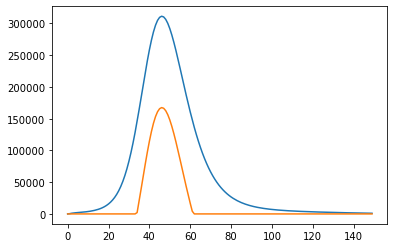

In [154]:
actual_beds = int(beds*(1-beds_already_taken))
daily_deths = [0]+[D[i]-D[i-1] for i in range(1, len(D))]
avoidable_deths = []
for i in daily_deths:
    if i > actual_beds:
        avoidable_deths.append(i-actual_beds)
    else:
        avoidable_deths.append(0)
plt.plot(daily_deths)
plt.plot(avoidable_deths)

Text(0.5, 1.0, 'Available vs Needed Beds')

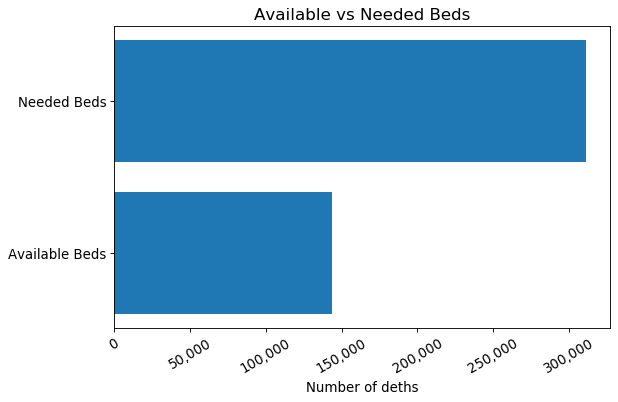

In [203]:
fig = plt.figure(num=None, figsize=(8, 5), dpi=80, facecolor='w', edgecolor='k')
ax = fig.add_subplot(111)
ax.barh(['Available Beds', 'Needed Beds'], [actual_beds, int(max(daily_deths))], align='center')
ax.tick_params(axis="x", labelsize=12, rotation=30)
ax.tick_params(axis="y", labelsize=12)
ax.get_xaxis().set_major_formatter(
        matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.set_xlabel("Number of deths", fontsize=12)
ax.set_title("Available vs Needed Beds", fontsize=15)

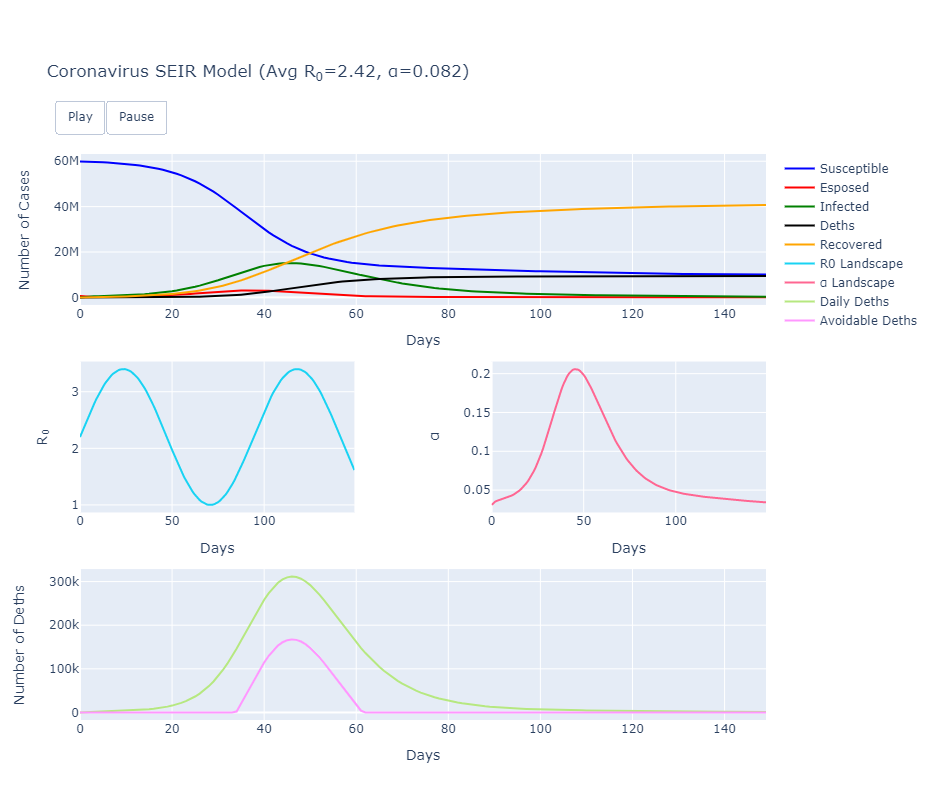

In [155]:
virus_SEIR_plot(S, E, I, R, D, R0_time, alpha_time, daily_deths, avoidable_deths)